In [9]:
include("State_Space_Model.jl")
using .state_space_model

include("Kalman.jl")
using .kalman

include("MCMC.jl")
using .MCMC

using Random
using LinearAlgebra
using Statistics
using Distributions
using ProgressMeter
using SpecialFunctions
using Plots
using ProgressMeter


In [10]:
# Parameters in θ
θ_elements = ["ρ", "λ_c", "c₁", "c₂", "v_ε, y", "v_ξ, y", "v_κ, y", "σ²_ε, y", "σ²_ξ, y", "σ²_κ, y", "σ²_ε, π", "σ²_ξ, π", "σ²_κ, π"]
n_params = length(θ_elements)

# List of prior distributions (all uniform for now).
prior_distributions = fill("uniform", n_params)
println("Prior distributions: ", prior_distributions)

# matrix of prior hyperparameters.
prior_hyperparameters = repeat([0 1], n_params, 1)
println("Prior hyperparameters:", prior_hyperparameters)

# Create the support matrix in the same way.
support = repeat([0 1], n_params, 1)
println("Support:", support)



#States in α
α_elements = [
    "u_t^y", 
    "β_t^y", 
    "u_t^π", 
    "β_t^π", 
    "ψ_{2,t}^y", 
    "ψ_{2,t}^{y*}", 
    "ψ_{1,t}^y", 
    "ψ_{1,t}^{y*}", 
    "ψ_{2,t}^π", 
    "ψ_{2,t}^{π*}", 
    "ψ_{1,t}^π", 
    "ψ_{1,t}^{π*}", 
    "tilde{ψ}_t^y", 
    "tilde{ψ}_{t-1}^y"
]


# True parameters
ρ = 0.9
λ_c = 0.1
c₁ = 0.1
c₂ = 0.1
v_ε = 1e-4
v_ξ = 1e-4
v_κ = 1e-4  
σ²_ε_y = 0.3
σ²_ξ_y = 0.5
σ²_κ_y = 0.8
σ²_ε_π = 0.01
σ²_ξ_π = 0.07
σ²_κ_π = 0.03

θ_true = [ρ, λ_c, c₁, c₂, v_ε, v_ξ, v_κ, σ²_ε_y, σ²_ξ_y, σ²_κ_y, σ²_ε_π, σ²_ξ_π, σ²_κ_π]

# cycle_order
cycle_order = 2

Prior distributions: ["uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform", "uniform"]
Prior hyperparameters:[0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1]
Support:[0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1; 0 1]


2

In [11]:
Z,H,T,R,Q,P_diffuse = state_space(θ_true, cycle_order)
println("Z = ", Z)
println("H = ", H)
println("T = ", T)
println("R = ", R)
println("Q = ", Q)
println("P_diffuse = ", P_diffuse)

# Print shapes
println("Z shape: ", size(Z))
println("H shape: ", size(H))
println("T shape: ", size(T))
println("R shape: ", size(R))
println("Q shape: ", size(Q))
println("P_diffuse shape: ", size(P_diffuse))

Z = [1.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.1 0.1]
H = [0.3 0.0001; 0.0001 0.01]
T = [1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 1.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.8955037487502232 0.08985007498214534 1.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 -0.08985007498214534 0.8955037487502232 0.0 1.0 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.8955037487502232 0.08985007498214534 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 -0.08985007498214534 0.8955037487502232 0.0 0.0 0.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.8955037487502232 0.08985007498214534 1.0 0.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 -0.08985007498214534 0.8955037487502232 0.0 1.0 0.0 0.0; 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.8955037487502232 0.08985007498214534 0.0 0.0;

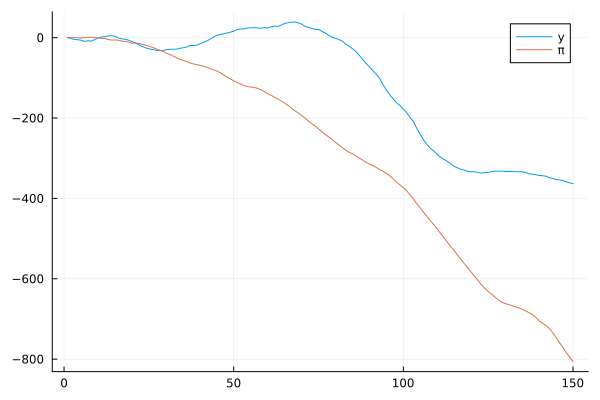

shape of obs = (150, 2)
shape of α = (150, 14)


In [12]:
n_obs = 150

#simulate data
obs, α = simulate_data(θ_true, cycle_order, n_obs)

# shape of obs
println("shape of obs = ", size(obs))
# shape of α
println("shape of α = ", size(α))

y = obs[:,1]
π = obs[:,2]

# plot data
plot(y, label="y")
plot!(π, label="π")
display(plot!())



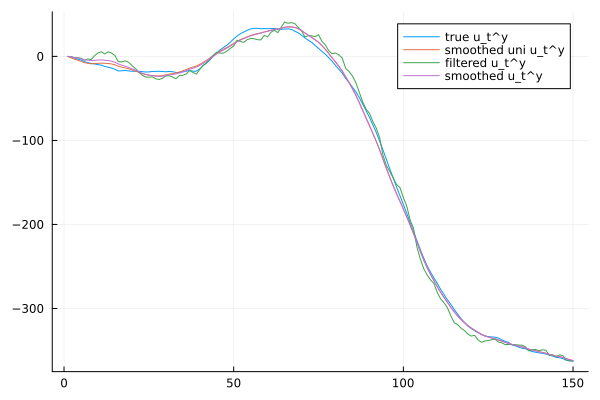

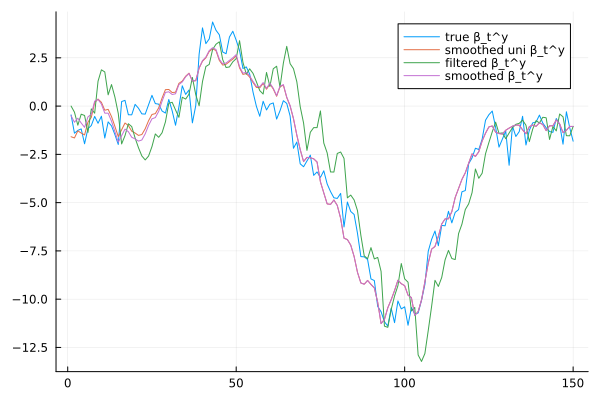

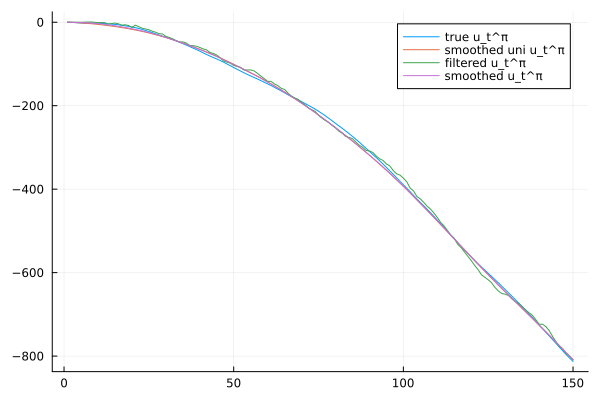

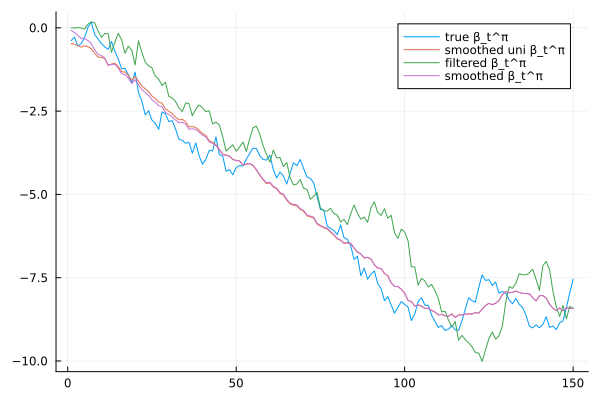

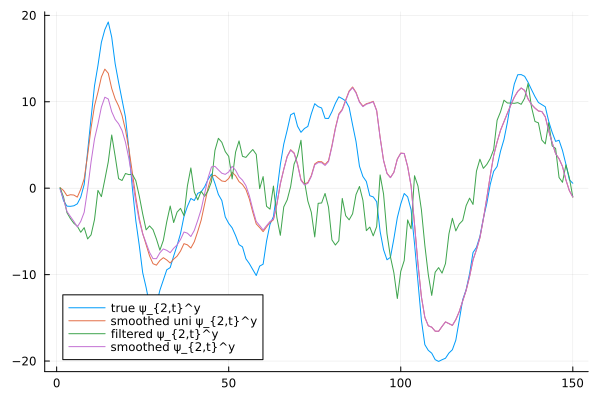

...

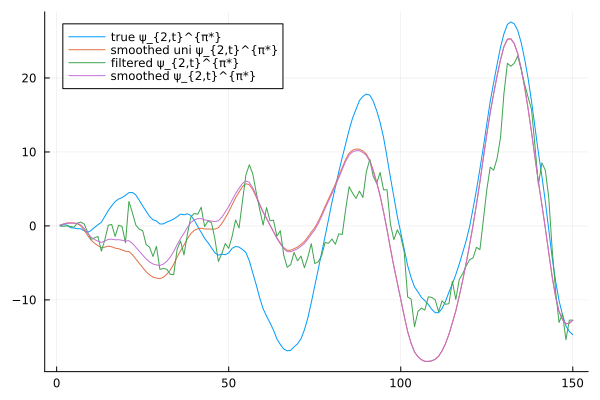

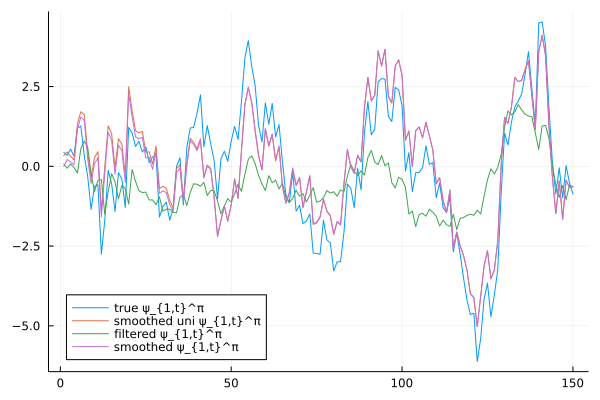

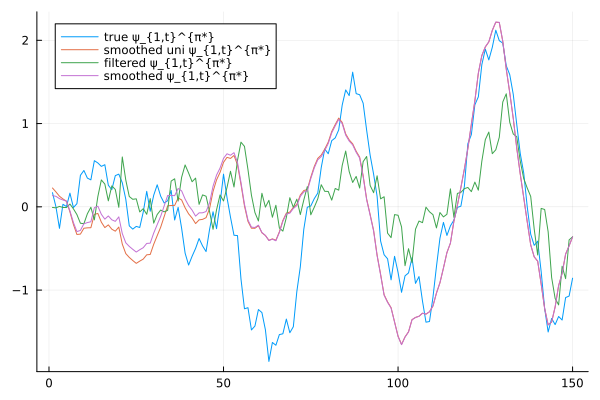

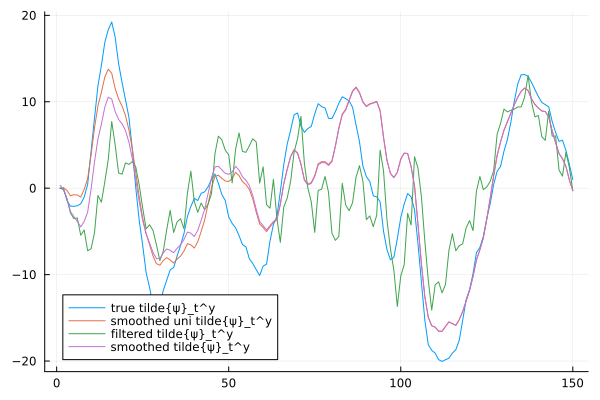

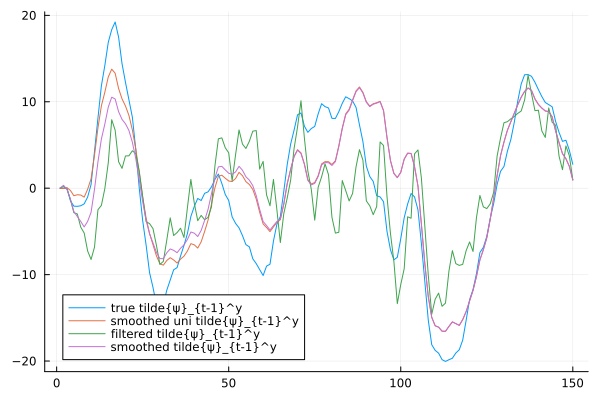

In [13]:
#Kalman filter 
α0 = zeros(size(T, 1))
P0 = Matrix(I, size(T, 1), size(T, 1))  # large initial uncertainty

LogL_diff, α_diff, P_diff = diffuse_kalman_filter(obs, θ_true, α0, P0, cycle_order, true, false)

LogL, α_f, P_f, α_p, P_p = kalman_filter(obs, θ_true, α0, P0, cycle_order)

α_s, P_s = kalman_smoother(θ_true, cycle_order, α_f, P_f, α_p, P_p)





for i in 1:size(α,2)
    plot(α[:,i], label="true $(α_elements[i])")
    plot!(α_diff[:,i], label="smoothed uni $(α_elements[i])")
    plot!(α_f[:,i], label="filtered $(α_elements[i])")
    plot!(α_s[:,i], label="smoothed $(α_elements[i])")
    display(plot!())
end






## MCMC

In [14]:
θ_draws, Γ_draws, Σ_Γ, accept_rate = mcmc_initialization(obs, θ_true, α0, P0, prior_distributions, prior_hyperparameters, support, 2, 20000, 10000, 0.5)

Progress:  11%|█████                                    |  ETA: 0:00:14

Kalman filter failed for θ_proposal: [0.9999993837377762, 0.07702240515628775, 4.630300898423201e-9, 1.2159073908045627e-7, 0.00010102578621355917, 3.0306468191462243e-9, 0.9999855538511659, 0.5147524395553369, 0.9996667221102108, 0.999999674438217, 1.5239710058702636e-25, 5.139361157631164e-10, 0.49536367364850803]


Progress: 100%|█████████████████████████████████████████| Time: 0:00:19


([0.9 0.10000000000000003 … 0.07000000000000002 0.030000000000000002; 0.8946432527519942 0.10621892659123527 … 0.060895994195609565 0.030397181618584096; … ; 0.9989316716154232 1.484073832555423e-57 … 4.445762293749512e-15 0.549674035261662; 0.9989316716154232 1.484073832555423e-57 … 4.445762293749512e-15 0.549674035261662], [2.1972245773362196 -2.197224577336219 … -2.5866893440979424 -3.4760986898352733; 2.1390728543181177 -2.129958551435069 … -2.7357588395822807 -3.4625366278579857; … ; 6.840591210055576 -130.8525594047572 … -33.04682504599153 0.19935375274859662; 6.840591210055576 -130.8525594047572 … -33.04682504599153 0.19935375274859662], [70.81552896543533 -102.67670952985662 … -0.32399682949362885 0.17491055009691758; -102.67670952985662 1153.5170613580608 … 49.674752587137675 -7.743726290597036; … ; -0.32399682949362885 49.674752587137675 … 63.32658394036233 -2.426047311586516; 0.17491055009691758 -7.743726290597036 … -2.426047311586516 3.3466295154625016], 0.4668)

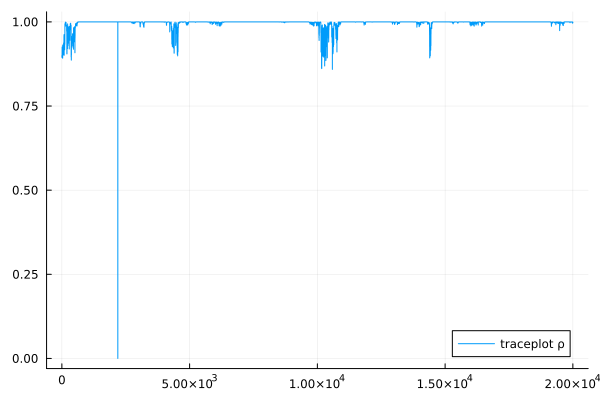

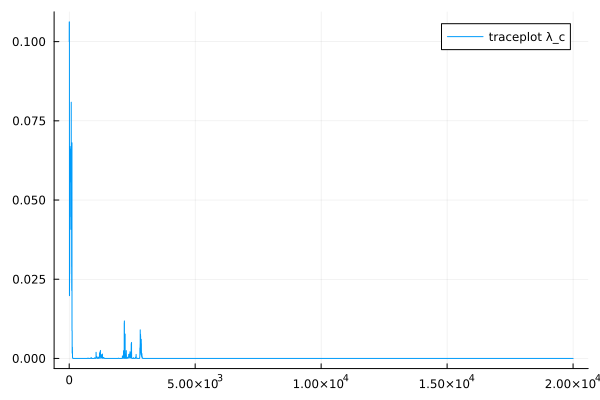

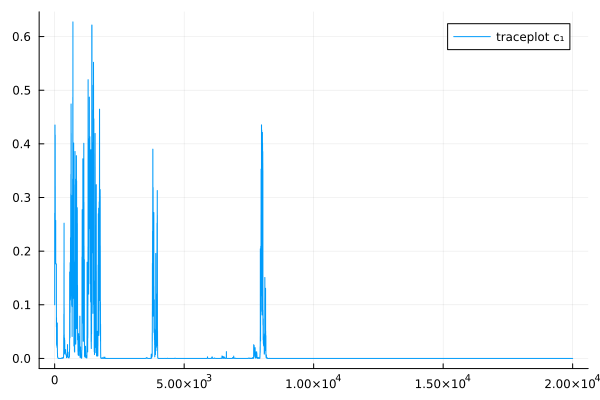

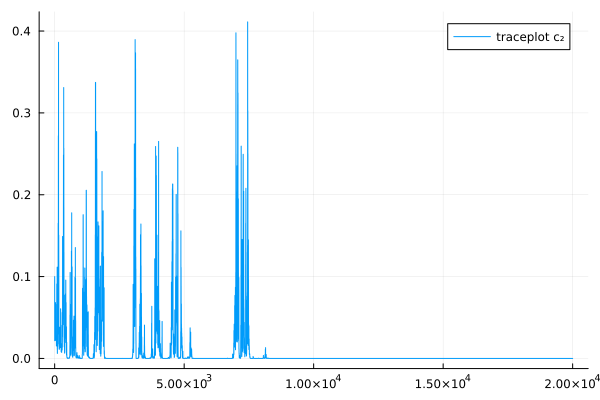

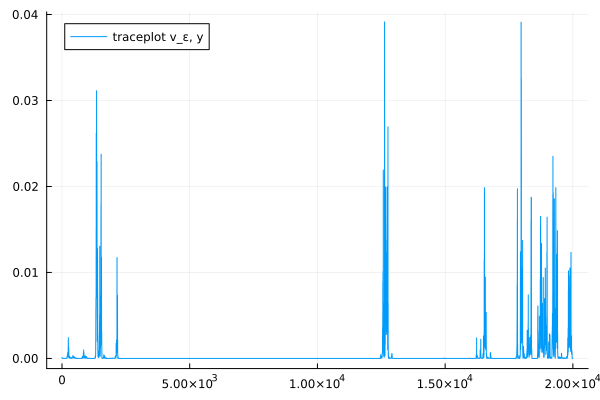

...

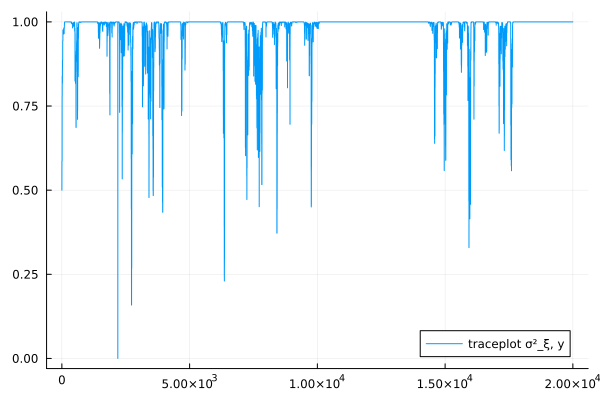

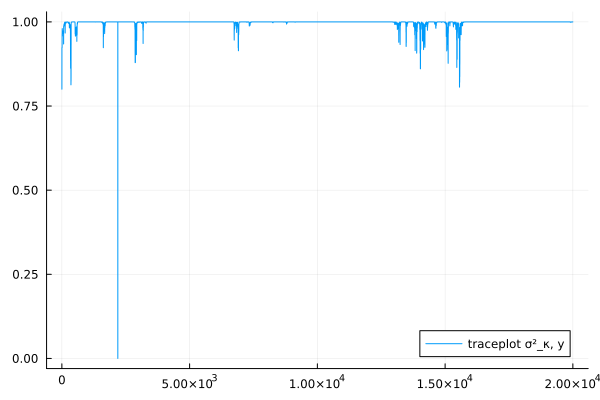

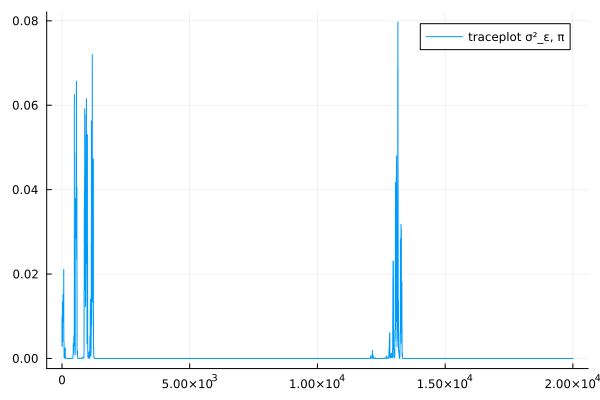

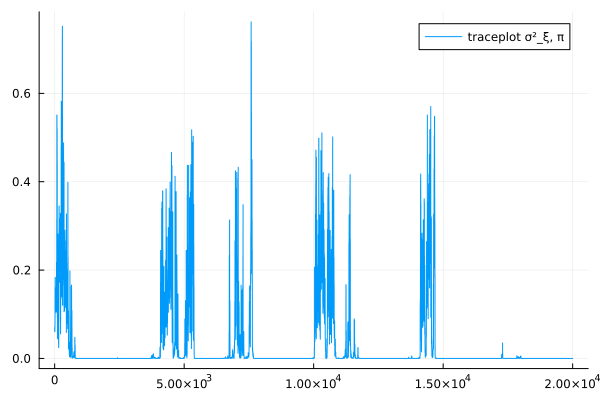

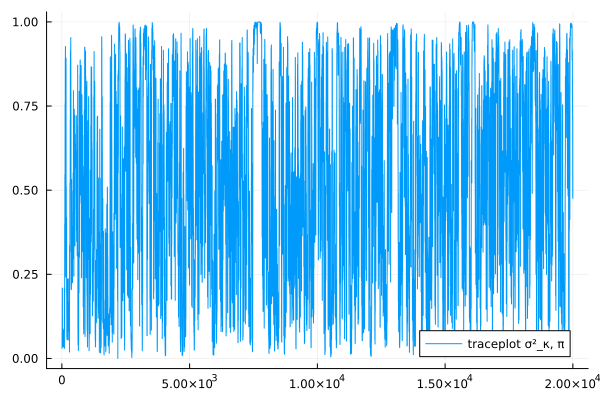

accept_rate = 0.4668


In [15]:
println("accept_rate = ", accept_rate)

#traceplots
for i in 1:n_params
    plot(θ_draws[:,i], label="traceplot $(θ_elements[i])")
    display(plot!())
end
